<a href="https://colab.research.google.com/github/Divyanshu9382/Machine-Learning/blob/main/Decision_Tree_wine_quality.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score , roc_curve

In [2]:
df = pd.read_csv('/content/drive/MyDrive/Dataset/winequality-red.csv')

In [3]:
df


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


# Understand data Profiling

In [4]:
!pip install -U ydata-profiling[notebook]==4.0.0 matplotlib==3.5.1

In [5]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df,title="Profiling Report")

/usr/local/lib/python3.10/dist-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/usr/local/lib/python3.10/dist-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


In [6]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
profile.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Data has duplicate rows,so we have to drop them.

In [8]:
x=df.drop(columns='quality')

In [9]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [10]:
y=df['quality']

In [11]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [12]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=.20, random_state=300)

In [13]:
dt_model=DecisionTreeClassifier()

In [14]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [15]:
dt_model.predict(x_test)

array([6, 6, 6, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       6, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 6, 7, 5, 6, 6, 6, 7, 5, 6, 8, 5,
       7, 6, 4, 6, 5, 6, 6, 7, 6, 5, 8, 5, 6, 5, 5, 6, 6, 7, 6, 7, 5, 5,
       6, 4, 6, 5, 5, 7, 5, 4, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 6, 4, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 5, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 7, 7, 5,
       6, 6, 5, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 7, 6, 6, 6, 6, 7,
       5, 6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 4, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 6, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 5, 7, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 6, 7, 4, 6, 6, 6, 5, 6, 6, 6, 5, 5,
       6, 7, 5, 5, 6, 4, 5, 6, 5, 6, 6, 5, 5, 6, 5, 7, 7, 6, 5, 6, 8, 5,
       6, 5, 6, 5, 5, 5, 5, 6, 7, 6, 6, 7, 5, 6, 5,

In [16]:
dt_model.score(x_test,y_test)

0.6

# Change criterion from default gini to entropy

In [17]:
dt_en = DecisionTreeClassifier(criterion='entropy')

In [18]:
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

# Again checking accuracy

In [19]:
dt_en.score(x_test,y_test)

0.609375

## Visualize tree

In [20]:
import sklearn
import  matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [21]:
sklearn.__version__

'1.2.2'

[Text(0.4697720363646842, 0.9791666666666666, 'x[10] <= 10.25\ngini = 0.639\nsamples = 1279\nvalue = [5, 43, 549, 513, 153, 16]'),
 Text(0.22491103331028123, 0.9375, 'x[1] <= 0.548\ngini = 0.507\nsamples = 665\nvalue = [3, 22, 417, 208, 14, 1]'),
 Text(0.14750461041954818, 0.8958333333333334, 'x[6] <= 60.5\ngini = 0.551\nsamples = 297\nvalue = [0, 7, 151, 129, 9, 1]'),
 Text(0.09215076071922546, 0.8541666666666666, 'x[9] <= 0.645\ngini = 0.555\nsamples = 205\nvalue = [0, 5, 82, 109, 8, 1]'),
 Text(0.05797602581834947, 0.8125, 'x[9] <= 0.465\ngini = 0.552\nsamples = 113\nvalue = [0, 4, 59, 47, 3, 0]'),
 Text(0.05025357307514984, 0.7708333333333334, 'x[9] <= 0.435\ngini = 0.153\nsamples = 12\nvalue = [0, 0, 11, 1, 0, 0]'),
 Text(0.04656523743660673, 0.7291666666666666, 'x[0] <= 10.05\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(0.042876901798063624, 0.6875, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(0.05025357307514984, 0.6875, 'gini = 0.0\nsamples = 1

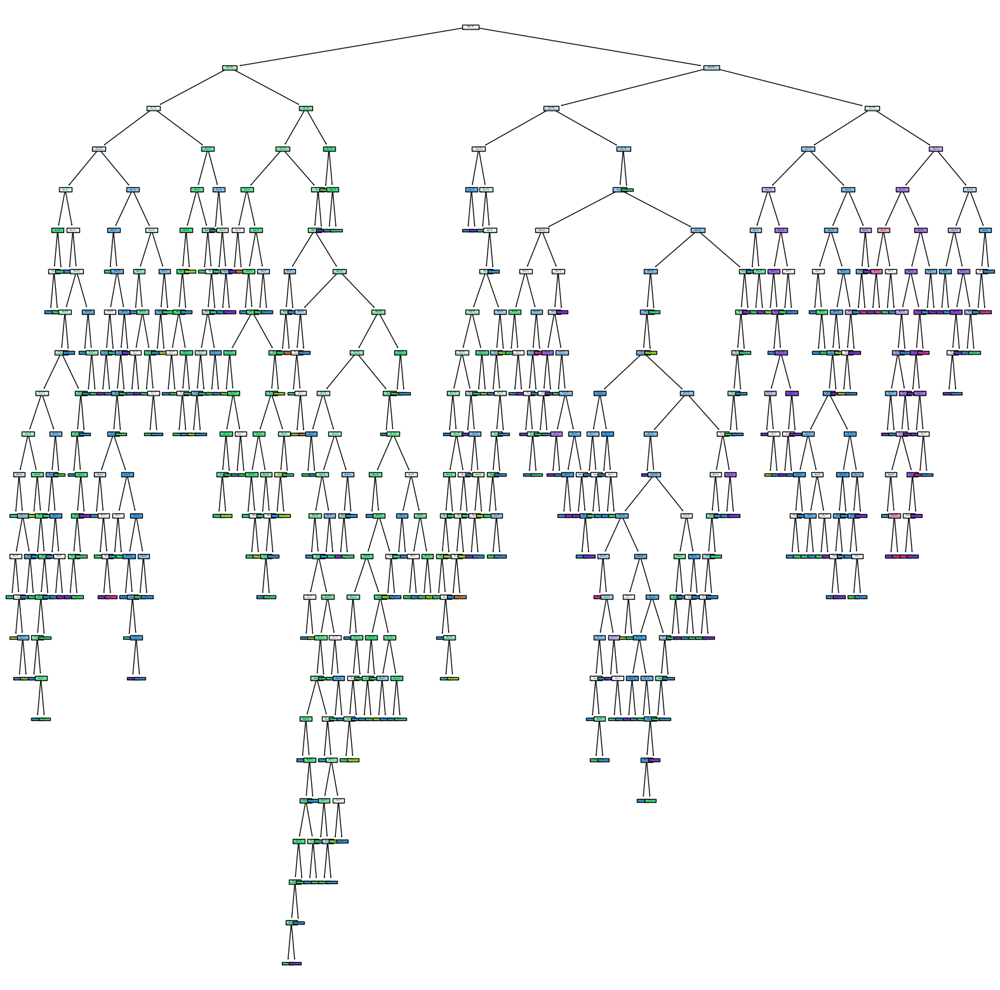

In [22]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

The above tree is not visible clearly , so build a small sample tree.***italicized text***

In [23]:
df1=df.head(500)

In [24]:
x1 = df1.drop(columns='quality')

In [25]:
y1 = df1['quality']

In [26]:
dt_model1 = DecisionTreeClassifier()

In [27]:
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

[Text(0.4504671391752577, 0.9705882352941176, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(0.2833880037488285, 0.9117647058823529, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(0.17502343017806934, 0.8529411764705882, 'citric acid <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(0.07638238050609185, 0.7941176470588235, 'alcohol <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(0.022492970946579195, 0.7352941176470589, 'sulphates <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(0.01499531396438613, 0.6764705882352942, 'density <= 0.998\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(0.007497656982193065, 0.6176470588235294, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(0.022492970946579195, 0.61764705882352

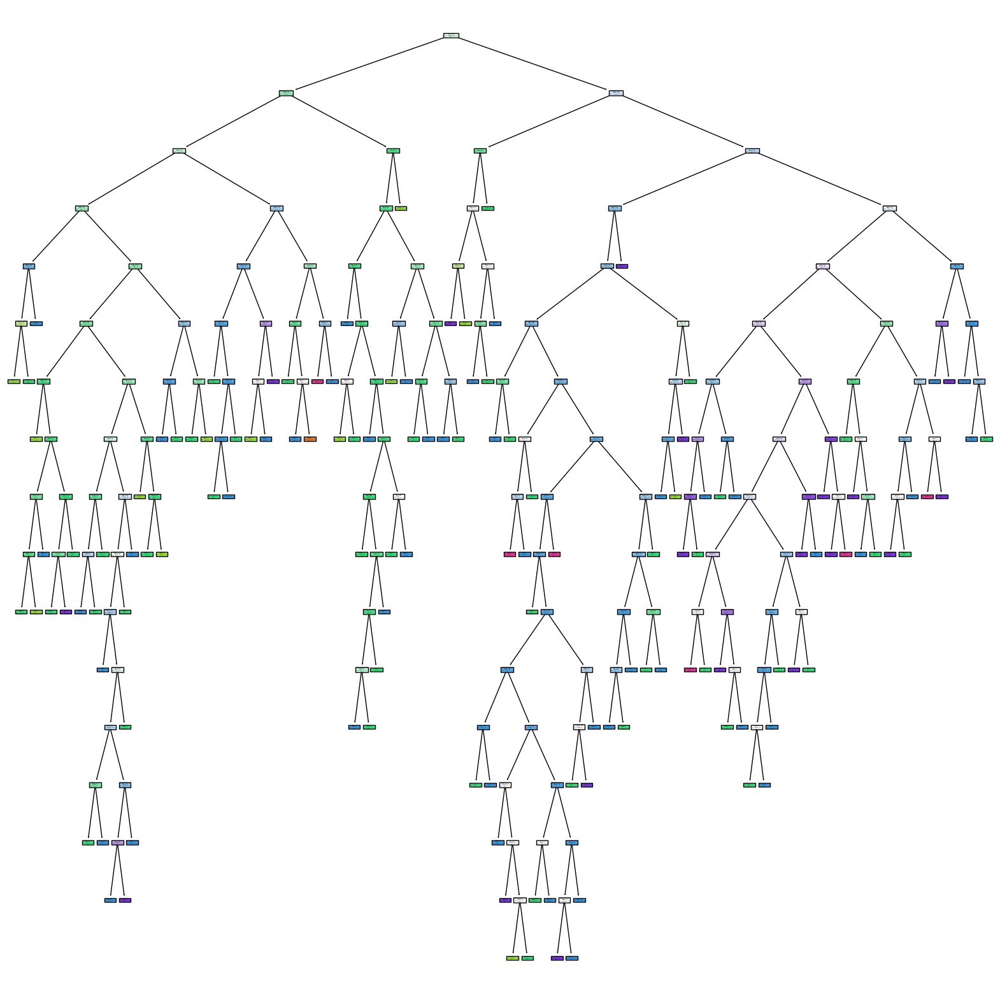

In [28]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)

In [29]:
set(y1) # knowing that how many classes we have in y sample data

{3, 4, 5, 6, 7, 8}

# save this tree figure

In [30]:
plt.savefig('tree.jpg')

<Figure size 640x480 with 0 Axes>

# Accuracy of sample model

In [31]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [32]:
dt_model.score(x_test,y_test)

0.6

# Tuning the model

In [33]:
path = dt_model.cost_complexity_pruning_path(x1,y1)
ccp_alpha  = path.ccp_alphas

In [34]:
ccp_alpha

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.00261111, 0.00262769,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00271329, 0.00272222,
       0.00283333, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00305051, 0.00308418, 0.00328205, 0.00333333,
       0.00333333, 0.00334032, 0.00336606, 0.00342857, 0.00343316,
       0.0035    , 0.0035    , 0.0036    , 0.00363636, 0.00373809,
       0.0038    , 0.0038237 , 0.004     , 0.00404444, 0.00428571,
       0.00437662, 0.00462338, 0.00465709, 0.00466667, 0.0048    ,
       0.00495726, 0.00504242, 0.00508235, 0.00509091, 0.00510606,
       0.00516667, 0.00568485, 0.00589394, 0.00656364, 0.00671079,
       0.0067591 , 0.00688352, 0.00688889, 0.007     , 0.00701

In [35]:
dt_model2 =[]
for ccp in ccp_alpha:
  dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
  dt_m.fit(x1,y1)
  dt_model2.append(dt_m)

In [36]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.00266666666

In [37]:
train_score=[i.score(x1,y1)for i in dt_model2]


In [38]:
test_score = [i.score(x_test,y_test)for i in dt_model2]

In [ ]:
train_score


In [ ]:
test_score


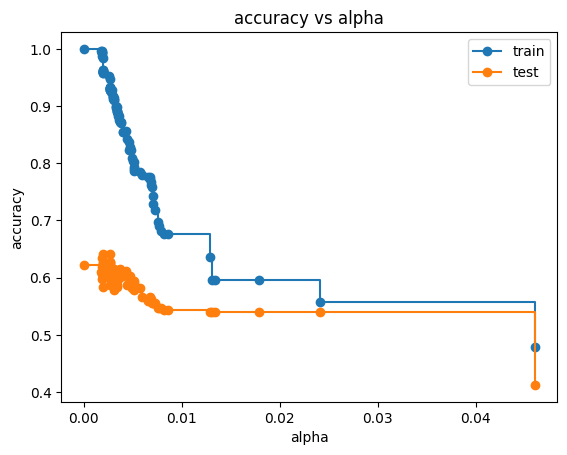

In [41]:
fig , ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("accuracy vs alpha")
ax.plot(ccp_alpha,train_score,marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alpha,test_score,marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()


# Now build a model with more suitable ccp value to increase accuracy of model

In [42]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha= 0.014)

In [43]:
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.5, 0.8333333333333334, 'x[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.25, 0.5, 'x[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(0.75, 0.5, 'x[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

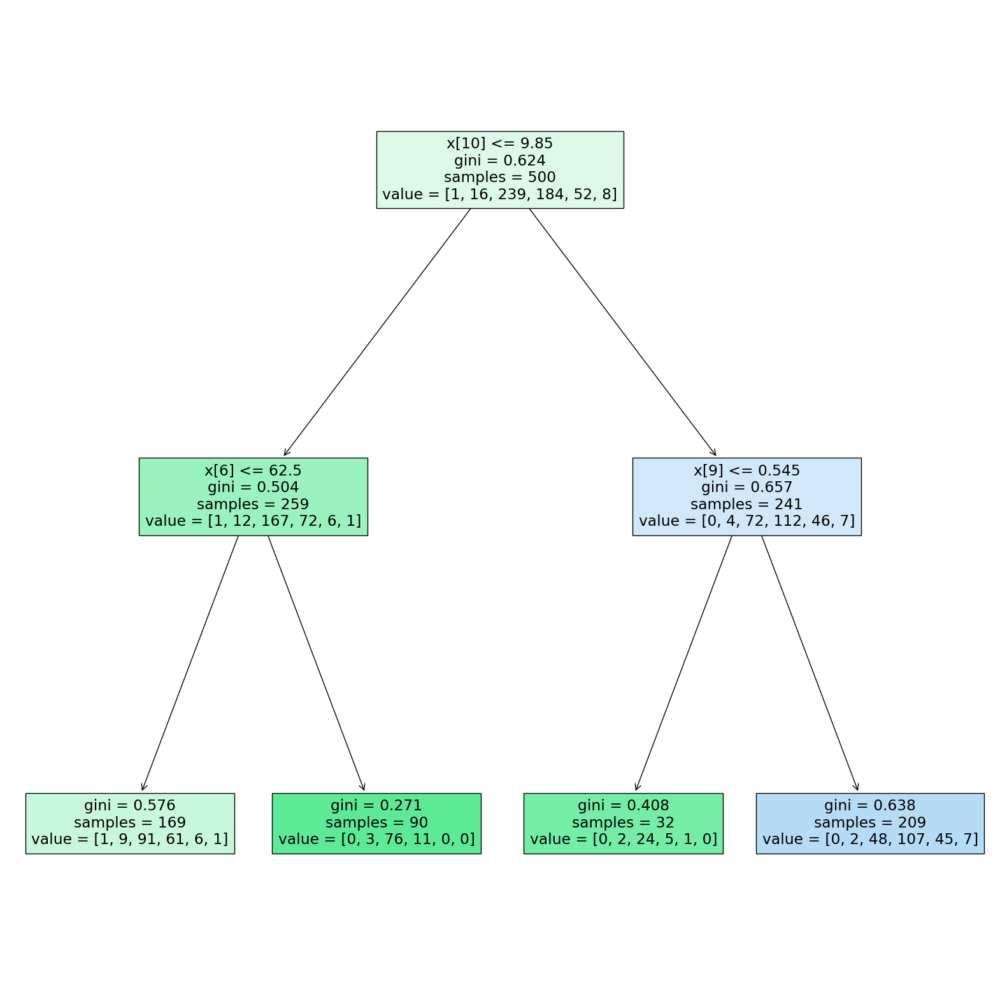

In [44]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [47]:
dt_model_ccp.score(x1,y1)

0.596

In [48]:
dt_model_ccp.score(x_test,y_test)

0.540625

In [49]:
DecisionTreeClassifier()

DecisionTreeClassifier()